In [17]:
import pandas as pd
import matplotlib.pyplot as plt

In [11]:
df_r33 = pd.read_csv('histogramR_33.csv')
df_g33 = pd.read_csv('histogramG_33.csv')
df_b33 = pd.read_csv('histogramB_33.csv')

In [21]:
df_r33.head(5)



,0,829,0.62425
0,1,401,0.30196
1,2,408,0.30723
2,3,337,0.25377
3,4,277,0.20858
4,5,306,0.23042


In [23]:

df_g33.head(5)



,0,405,0.30963
0,1,370,0.28287
1,2,334,0.25535
2,3,294,0.22477
3,4,212,0.16208
4,5,214,0.16361


In [24]:
df_b33.head(5)

,0,3327,1
0,1,618,0.18575
1,2,537,0.16141
2,3,443,0.13315
3,4,471,0.14157
4,5,444,0.13345


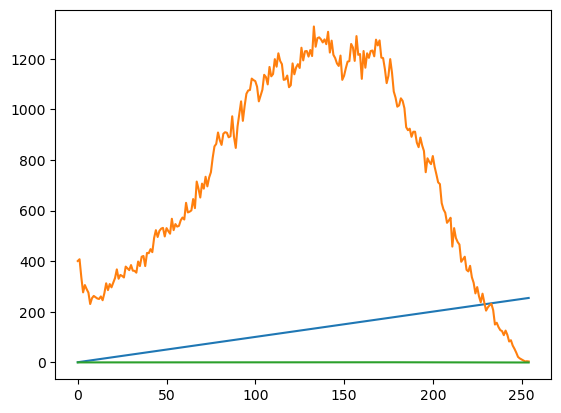

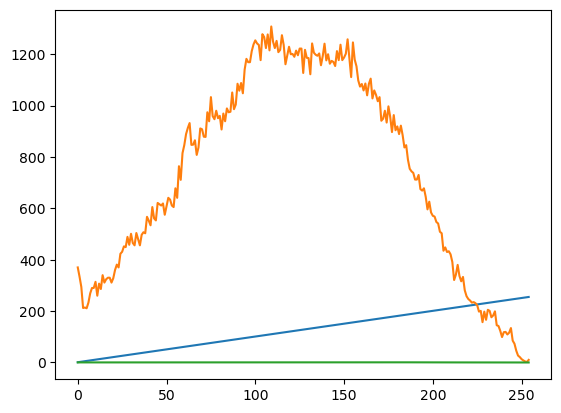

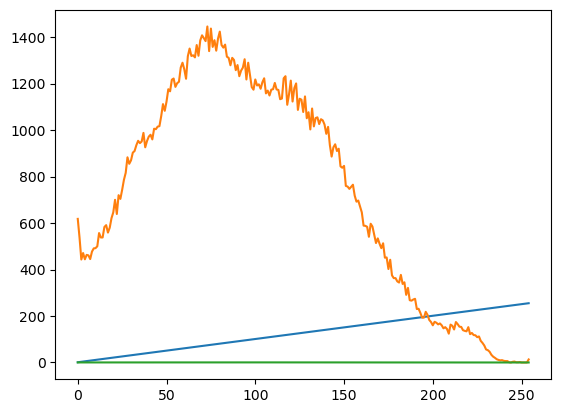

In [25]:
plt.plot(df_r33)
plt.show()
plt.plot(df_g33)
plt.show()
plt.plot(df_b33)
plt.show()

In [ ]:
image = cv2.imread('camo1.jpg', cv2.IMREAD_COLOR)

#The first two colons : take all rows and columns, while 2 specifies that we want the third dimension, 
# which corresponds to the Blue channel in an RGB image. 

# Access the Red, Green, and Blue channels
red_channel = image[:, :, 0] #extracts all pixels' red values.
green_channel = image[:, :, 1] #extracts all pixels' green values.
blue_channel = image[:, :, 2] #extracts all pixels' blue values.

# Display each channel
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(red_channel)
plt.title('Red Channel')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(green_channel)
plt.title('Green Channel')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(blue_channel)
plt.title('Blue Channel')
plt.axis('off')

plt.show()

### Method 1: Following cross-corelation in traditional way

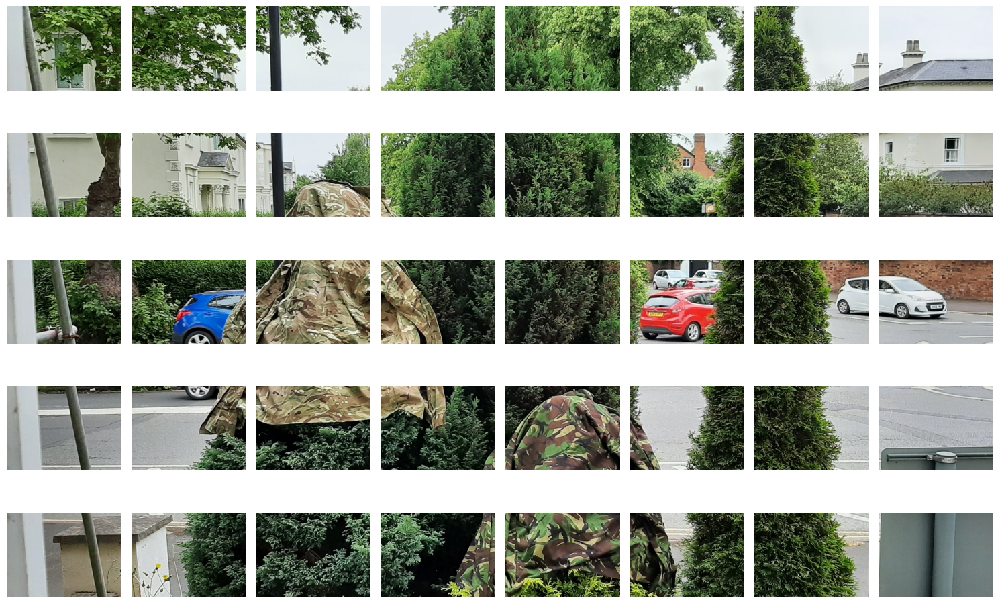

In [39]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image using OpenCV
filename = 'camo1.jpg'
image = cv2.imread(filename)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying correctly
#image = image[:,:, 0] # taking only red channel

normalized_image = image / 255.0


# Convert the normalized image to float32
normalized_image = normalized_image.astype('float32')

# Get the dimensions of the image
height, width, _ = normalized_image.shape

# Calculate the size of each block
row_size = height // 5
col_size = width // 8

# Divide the image into 5 rows and 8 columns
blocks = []
for i in range(5):
    for j in range(8):
        block = normalized_image[i*row_size:(i+1)*row_size, j*col_size:(j+1)*col_size]
        blocks.append(block)

# Display the blocks in subplots
plt.figure(figsize=(15, 10))
for idx, block in enumerate(blocks):
    plt.subplot(5, 8, idx + 1)
    plt.imshow(block)
    plt.axis('off')
plt.tight_layout()
plt.show()


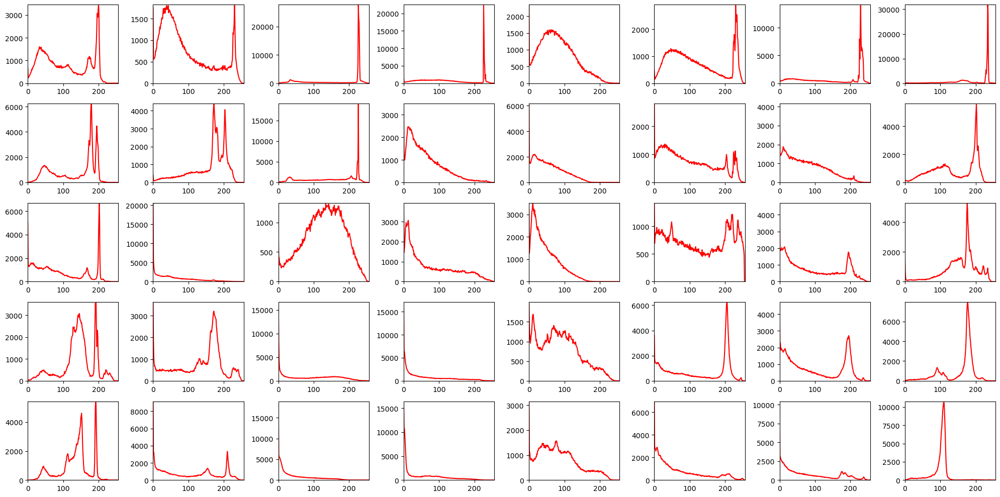

In [47]:
# Display the histograms of the red channel of the blocks in subplots
plt.figure(figsize=(20, 10))
for idx, block in enumerate(blocks):
    plt.subplot(5, 8, idx + 1)
    red_channel = block[:, :, 0]  # Extract the red channel
    hist = cv2.calcHist([red_channel], [0], None, [256], [0, 1])  # Calculate histogram for red channel
    plt.plot(hist, color='r')
    plt.xlim([0, 256])
    plt.ylim([0, np.max(hist)])  # Set y-axis limit based on max histogram value
    # plt.axis('off')
plt.tight_layout()
plt.show()

<Axes: >

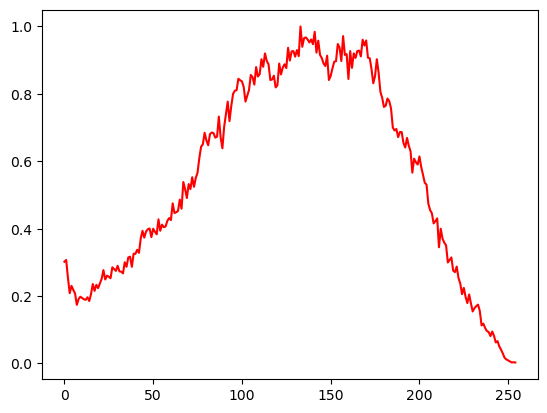

In [48]:
reference_hist_file = pd.read_csv('histogramR_33.csv')
reference_hist = reference_hist_file[reference_hist_file.columns[2]]
#plt.hist(reference_hist)
reference_hist.plot(color='r')

<Axes: >

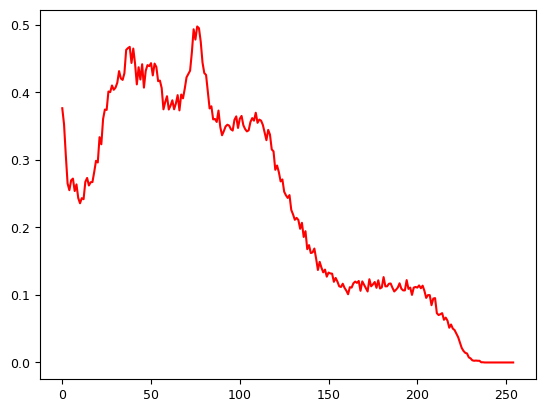

In [96]:
reference_hist_file_2 = pd.read_csv('histogramR_55.csv')
reference_hist2 = reference_hist_file_2[reference_hist_file_2.columns[2]]
#plt.hist(reference_hist)
reference_hist2.plot(color='r')

#### Task 1: Try this histogram cross—correlation process as a sliding window function

##### histogramR_33

In [83]:
import csv

# Function to compute histogram for a given image patch
def compute_histogram(image_patch):
    hist = cv2.calcHist([image_patch], [0], None, [256], [0, 1])
    hist = hist / np.sum(hist)  # Normalize the histogram
    return hist

# function slides a window across the entire red channel of the normalized image.
#For each window, it computes the histogram and performs cross-correlation with the reference histogram.
#The result of the cross-correlation is stored in corr_result.
def cross_correlation(image, reference_hist, window_size):
    height, width = image.shape
    corr_result = np.zeros((height - window_size + 1, width - window_size +1))

    for i in range(height - window_size + 1):
        for j in range(width - window_size +1):
            window = image[i:i+window_size, j: j+window_size]
            window_hist = compute_histogram(window)
            corr = np.correlate(reference_hist, window_hist.flatten())
            corr_result[i, j] = corr

    return corr_result


In [84]:
# Import the reference histogram from a CSV file
reference_hist = []
with open('histogramR_33.csv', 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        reference_hist.append(float(row[1]))
reference_hist = np.array(reference_hist)

In [85]:
normalized_image = image / 255.0
normalized_image = normalized_image.astype('float32')
red_channel_image = normalized_image[:,:,0]


In [86]:
corr_result = cross_correlation(red_channel_image, reference_hist, 5)

/var/folders/xr/x_j1pnw55ms124rjm48zs7k00000gn/T/ipykernel_7544/2711073754.py:21: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  corr_result[i, j] = corr
/var/folders/xr/x_j1pnw55ms124rjm48zs7k00000gn/T/ipykernel_7544/2711073754.py:6: RuntimeWarning: invalid value encountered in divide
  hist = hist / np.sum(hist)  # Normalize the histogram


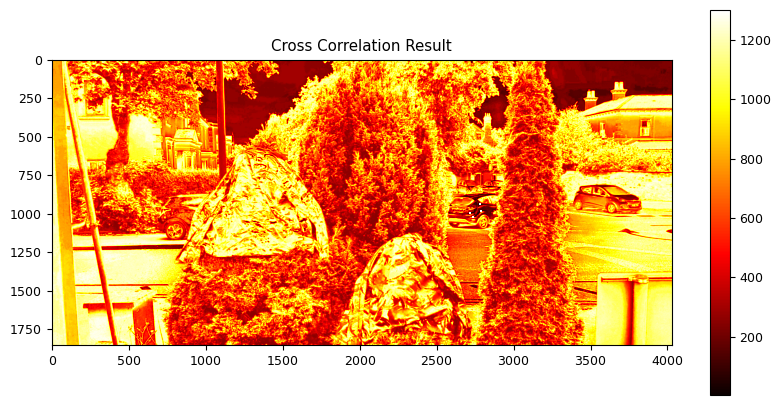

In [87]:

#display the result
plt.figure(figsize=(10, 5))
plt.imshow(corr_result, cmap='hot')
plt.title('Cross Correlation Result')
plt.colorbar()
plt.show()

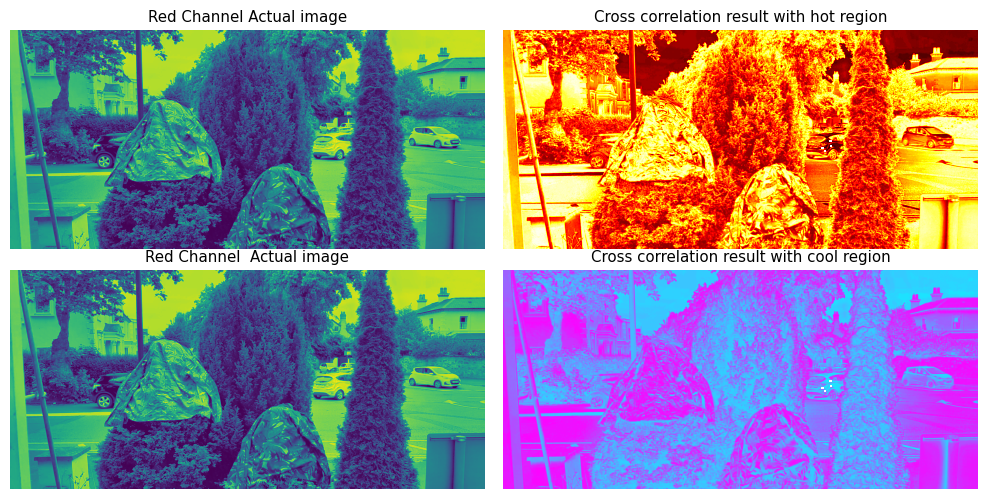

In [88]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

axes[0, 0].imshow(normalized_image[:,:,0])
axes[0, 0].set_title('Red Channel Actual image')
axes[0, 0].axis('off')

axes[0, 1].imshow(corr_result, cmap='hot')
axes[0, 1].set_title('Cross correlation result with hot region')
axes[0, 1].axis('off')

axes[1, 0].imshow(normalized_image[:,:,0])
axes[1, 0].set_title('Red Channel  Actual image')
axes[1, 0].axis('off')

axes[1, 1].imshow(corr_result, cmap='cool')
axes[1, 1].set_title('Cross correlation result with cool region')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

#### Task 2: Repeat the process but with this time with cell r55 (the disruptive pattern)

##### histogramR_55

In [97]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import csv

# Read the image using OpenCV
filename = 'camo1.jpg'
image = cv2.imread(filename)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying correctly

# Normalize the image to the range [0, 1]
normalized_image = image / 255.0

# Convert the normalized image to float32
normalized_image = normalized_image.astype('float32')

# Function to compute histogram for a given image patch
def compute_histogram(image_patch):
    hist = cv2.calcHist([image_patch], [0], None, [256], [0, 1])
    hist = hist / np.sum(hist)  # Normalize the histogram
    return hist.flatten()

# Import the reference histogram from a CSV file
reference_hist = []
with open('histogramR_55.csv', 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        reference_hist.append(float(row[1]))
reference_hist = np.array(reference_hist)

# Cross-correlation function using template matching
def cross_correlation(image, reference_hist, window_size):
    height, width = image.shape
    reference_hist = reference_hist.reshape(-1, 1)
    corr_result = np.zeros((height - window_size + 1, width - window_size + 1))

    for i in range(height - window_size + 1):
        for j in range(width - window_size + 1):
            window = image[i:i + window_size, j:j + window_size]
            window_hist = compute_histogram(window)
            corr = np.correlate(reference_hist.flatten(), window_hist)
            corr_result[i, j] = corr

    return corr_result

# Perform cross-correlation using the reference histogram
red_channel = normalized_image[:, :, 0]
corr_result = cross_correlation(red_channel, reference_hist, 8)



/var/folders/xr/x_j1pnw55ms124rjm48zs7k00000gn/T/ipykernel_7544/521116398.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  corr_result[i, j] = corr


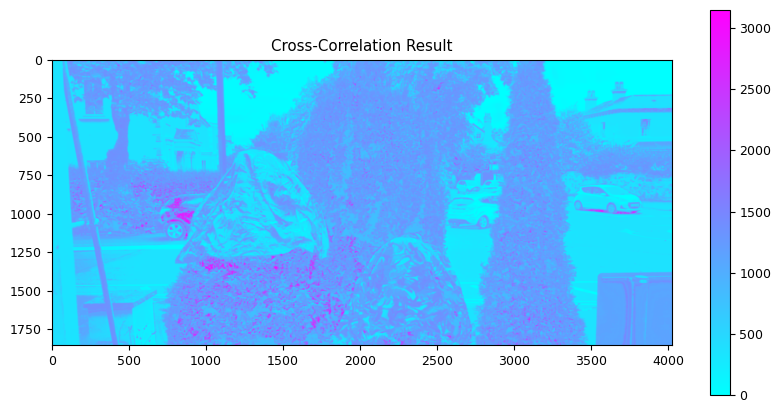

In [98]:
# Display the result
plt.figure(figsize=(10, 5))
plt.imshow(corr_result, cmap='cool')
plt.title('Cross-Correlation Result')
plt.colorbar()
plt.show()

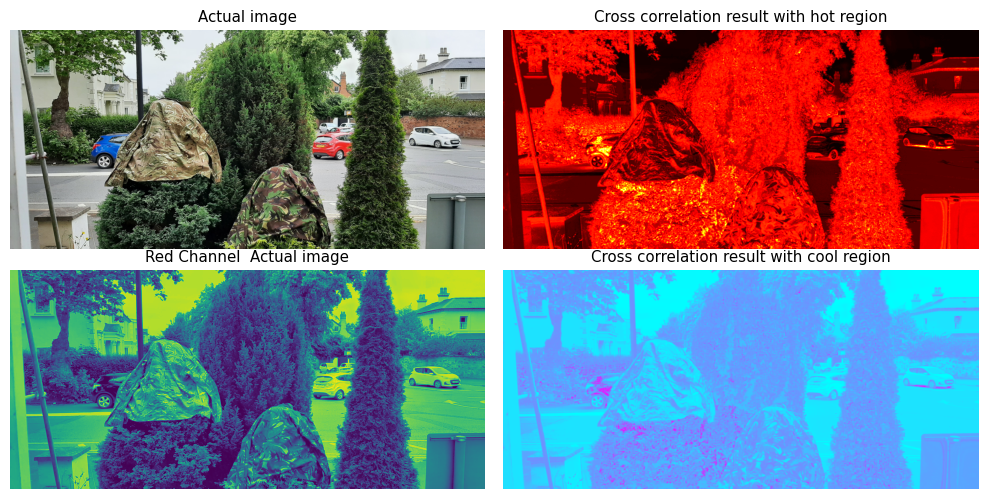

In [99]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

axes[0, 0].imshow(normalized_image)
axes[0, 0].set_title('Actual image')
axes[0, 0].axis('off')

axes[0, 1].imshow(corr_result, cmap='hot')
axes[0, 1].set_title('Cross correlation result with hot region')
axes[0, 1].axis('off')

axes[1, 0].imshow(normalized_image[:,:,0])
axes[1, 0].set_title('Red Channel  Actual image')
axes[1, 0].axis('off')

axes[1, 1].imshow(corr_result, cmap='cool')
axes[1, 1].set_title('Cross correlation result with cool region')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

### Method 2 (Looking for similarity with pattern in an image)

Reference: https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_windowed_histogram.html

In [26]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

from skimage import data, transform
from skimage.util import img_as_ubyte
from skimage.morphology import rectangle
from skimage.filters import rank


matplotlib.rcParams['font.size'] = 9


def windowed_histogram_similarity(image, footprint, reference_hist, n_bins):
    # Compute normalized windowed histogram feature vector for each pixel
    px_histograms = rank.windowed_histogram(image, footprint, n_bins=n_bins)

    # Reshape coin histogram to (1,1,N) for broadcast when we want to use it in
    # arithmetic operations with the windowed histograms from the image
    reference_hist = reference_hist.reshape((1, 1) + reference_hist.shape)

    # Compute Chi squared distance metric: sum((X-Y)^2 / (X+Y));
    # a measure of distance between histograms
    X = px_histograms
    Y = reference_hist

    num = (X - Y) ** 2
    denom = X + Y
    denom[denom == 0] = np.inf
    frac = num / denom

    chi_sqr = 0.5 * np.sum(frac, axis=2)

    # Generate a similarity measure. It needs to be low when distance is high
    # and high when distance is low; taking the reciprocal will do this.
    # Chi squared will always be >= 0, add small value to prevent divide by 0.
    similarity = 1 / (chi_sqr + 1.0e-4)

    return similarity


# Load the `skimage.data.coins` image
img =  cv2.imread('camo1.jpg', cv2.IMREAD_COLOR)[:,:,0] #img_as_ubyte(data.coins())

# Quantize to 16 levels of grayscale; this way the output image will have a
# 16-dimensional feature vector per pixel
quantized_img = img // 16

# # Select the coin from the 4th column, second row.
# # Coordinate ordering: [x1,y1,x2,y2]
coin_coords = [184, 100, 228, 148]  # 44 x 44 region
coin = quantized_img[coin_coords[1] : coin_coords[3], coin_coords[0] : coin_coords[2]]

# # Compute coin histogram and normalize
coin_hist, _ = np.histogram(coin.flatten(), bins=16, range=(0, 16))
coin_hist = coin_hist.astype(float) / np.sum(coin_hist)

window_ratio = 3
img_height, img_width = img.shape
window_size = [int(img_height / window_ratio), int(img_width / window_ratio)]

half_height = window_size[0] // 2
half_width = window_size[1] // 2
# Compute a disk shaped mask that will define the shape of our sliding window
# Example coin is ~44px across, so make a disk 61px wide (2 * rad + 1) to be
# big enough for other coins too.
footprint = rectangle(half_height, half_width)

# Compute the similarity across the complete image
similarity = windowed_histogram_similarity(
    quantized_img, footprint, coin_hist, coin_hist.shape[0]
)

# Now try a rotated image
rotated_img = img_as_ubyte(transform.rotate(img, 45.0, resize=True))
# Quantize to 16 levels as before
quantized_rotated_image = rotated_img // 16
# Similarity on rotated image
rotated_similarity = windowed_histogram_similarity(
    quantized_rotated_image, footprint, coin_hist, coin_hist.shape[0]
)


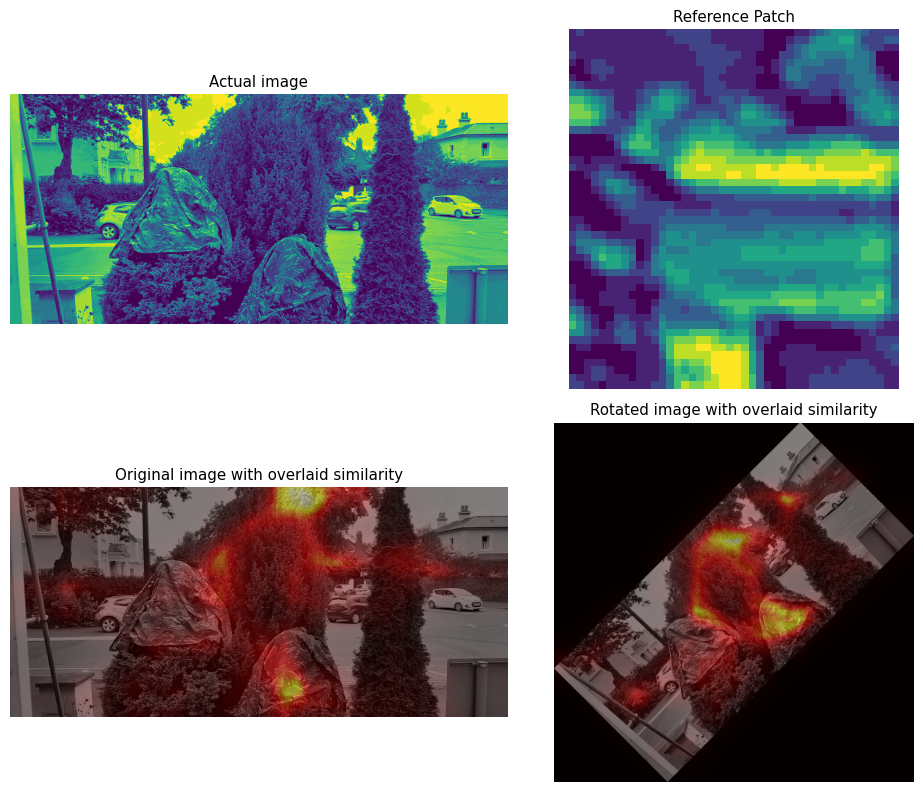

In [27]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

axes[0, 0].imshow(quantized_img)
axes[0, 0].set_title('Actual image')
axes[0, 0].axis('off')

axes[0, 1].imshow(coin)
axes[0, 1].set_title('Reference Patch')
axes[0, 1].axis('off')

axes[1, 0].imshow(img, cmap='gray')
axes[1, 0].imshow(similarity, cmap='hot', alpha=0.5)
axes[1, 0].set_title('Original image with overlaid similarity')
axes[1, 0].axis('off')

axes[1, 1].imshow(rotated_img, cmap='gray')
axes[1, 1].imshow(rotated_similarity, cmap='hot', alpha=0.5)
axes[1, 1].set_title('Rotated image with overlaid similarity')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

#### Method 3: Template matching

reference: https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_template.html

### Result: Not working because 'We use template matching to identify the occurrence of an image patch (in this case, a sub-image centered on a single coin/shape). Here, we return a single match (the exact same coin/shape), so the maximum value in the match_template result corresponds to the coin location. The other coins look similar, and thus have local maxima; if you expect multiple matches, you should use a proper peak-finding function.

The match_template function uses fast, normalized cross-correlation [1] to find instances of the template in the image. Note that the peaks in the output of match_template correspond to the origin (i.e. top-left corner) of the template.'

In [5]:
import matplotlib.pyplot as plt
import cv2

filename = 'camo1.jpg'
image = cv2.imread(filename)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying correctly
#image = image[:,:, 0] # taking only red channel

normalized_image = image / 255.0


# Convert the normalized image to float32
normalized_image = normalized_image.astype('float32')

# Get the dimensions of the image
height, width, _ = normalized_image.shape

# Calculate the size of each block
row_size = height // 5
col_size = width // 8

# Divide the image into 5 rows and 8 columns
blocks = []
for i in range(5):
    for j in range(8):
        block = normalized_image[i*row_size:(i+1)*row_size, j*col_size:(j+1)*col_size]
        blocks.append(block)




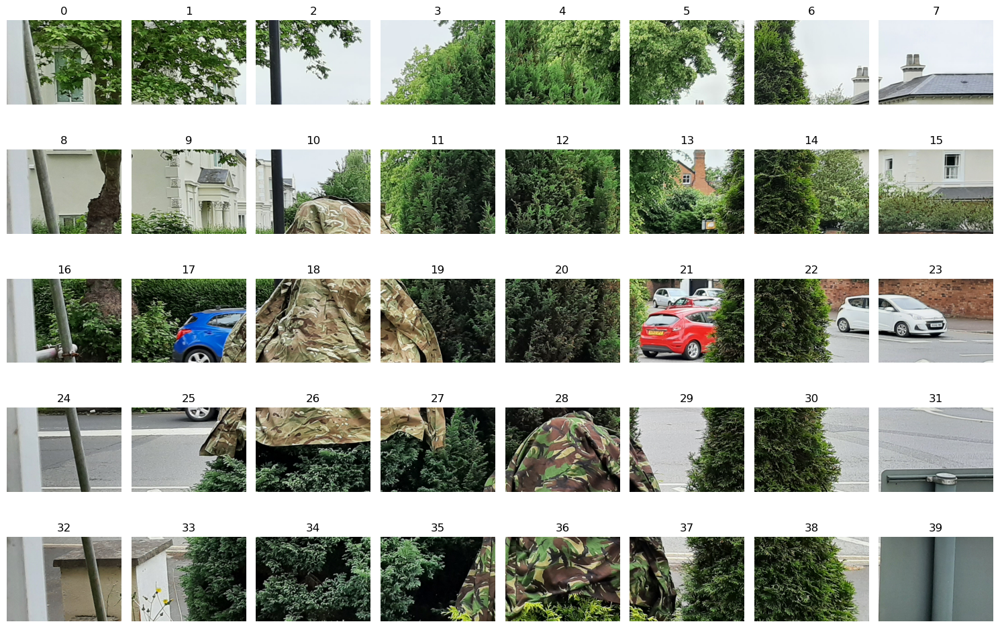

In [6]:
# Display the blocks in subplots
plt.figure(figsize=(15, 10))
for idx, block in enumerate(blocks):
    text = idx
    plt.subplot(5, 8, idx + 1)
    plt.title(text)
    plt.imshow(block)
    plt.axis('off')
plt.tight_layout()
plt.show()

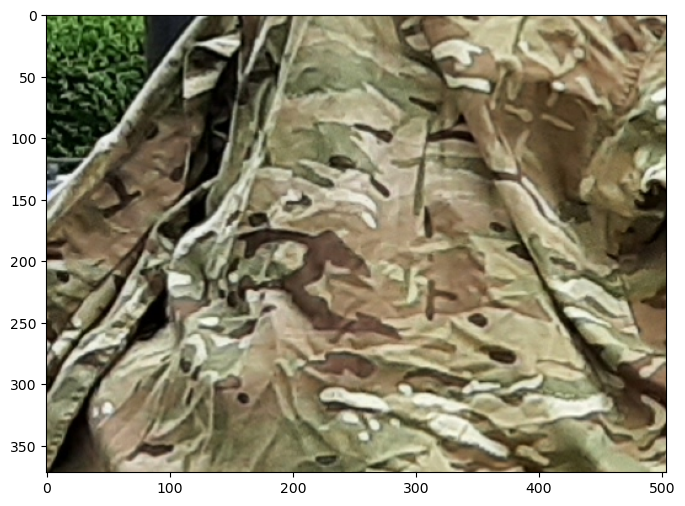

In [7]:
# Display the blocks in subplots
plt.figure(figsize=(8, 8))
plt.imshow(blocks[18])
plt.show()

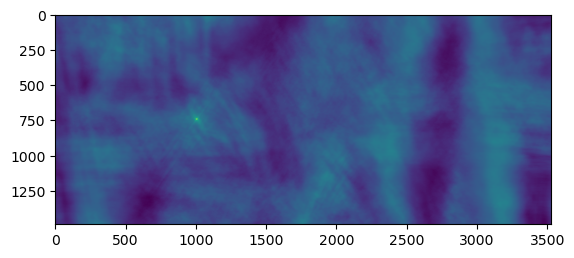

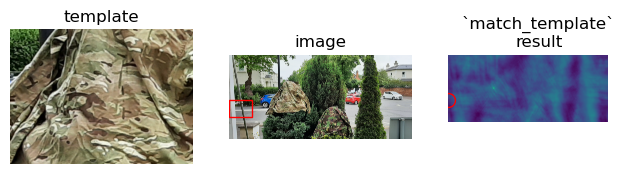

In [8]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.feature import match_template


image = normalized_image #data.coins()
temp_to_match = blocks[18] #image[170:220, 75:130]

result = match_template(image, temp_to_match)
plt.imshow(result)
ij = np.unravel_index(np.argmax(result), result.shape)
x, y, _ = ij[::-1]

fig = plt.figure(figsize=(8, 3))
ax1 = plt.subplot(1, 3, 1)
ax2 = plt.subplot(1, 3, 2)
ax3 = plt.subplot(1, 3, 3, sharex=ax2, sharey=ax2)

ax1.imshow(temp_to_match, cmap=plt.cm.gray)
ax1.set_axis_off()
ax1.set_title('template')

ax2.imshow(image, cmap=plt.cm.gray)
ax2.set_axis_off()
ax2.set_title('image')
# highlight matched region
hcoin, wcoin, _ = temp_to_match.shape
rect = plt.Rectangle((x, y), wcoin, hcoin, edgecolor='r', facecolor='none')
ax2.add_patch(rect)

ax3.imshow(result)
ax3.set_axis_off()
ax3.set_title('`match_template`\nresult')
# highlight matched region
ax3.autoscale(False)
ax3.plot(x, y, 'o', markeredgecolor='r', markerfacecolor='none', markersize=10)

plt.show()

### Method 4: Multiple objects template matching
Reference: https://answers.opencv.org/question/165740/template-matching-multiple-objects/

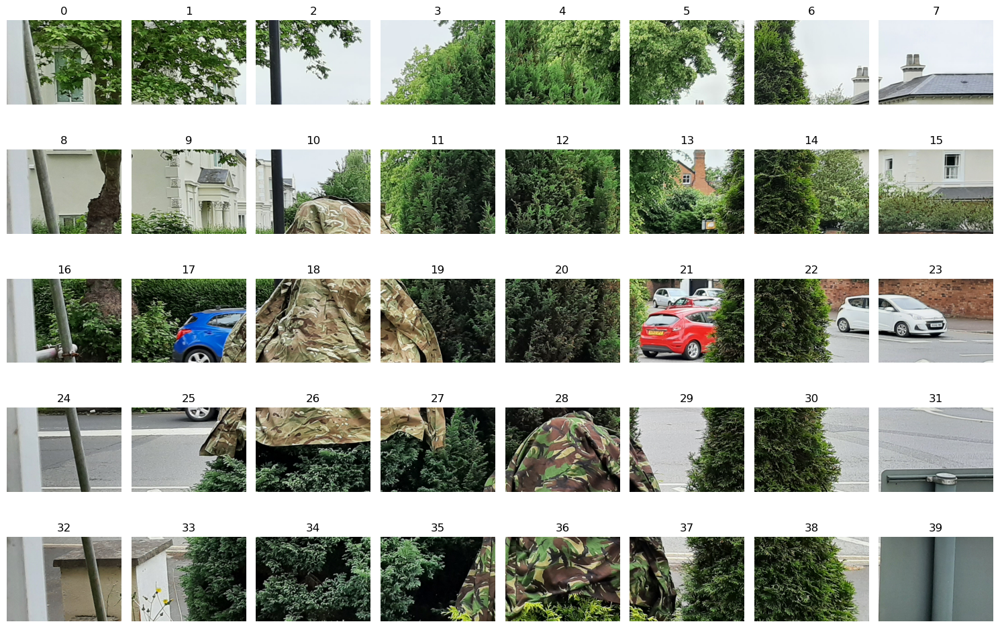

In [9]:
import matplotlib.pyplot as plt
import cv2

filename = 'camo1.jpg'
image = cv2.imread(filename)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying correctly
#image = image[:,:, 0] # taking only red channel

normalized_image = image / 255.0


# Convert the normalized image to float32
normalized_image = normalized_image.astype('float32')

# Get the dimensions of the image
height, width, _ = normalized_image.shape

# Calculate the size of each block
row_size = height // 5
col_size = width // 8

# Divide the image into 5 rows and 8 columns
blocks = []
for i in range(5):
    for j in range(8):
        block = normalized_image[i*row_size:(i+1)*row_size, j*col_size:(j+1)*col_size]
        blocks.append(block)
# Display the blocks in subplots
plt.figure(figsize=(15, 10))
for idx, block in enumerate(blocks):
    text = idx
    plt.subplot(5, 8, idx + 1)
    plt.title(text)
    plt.imshow(block)
    plt.axis('off')
plt.tight_layout()
plt.show()

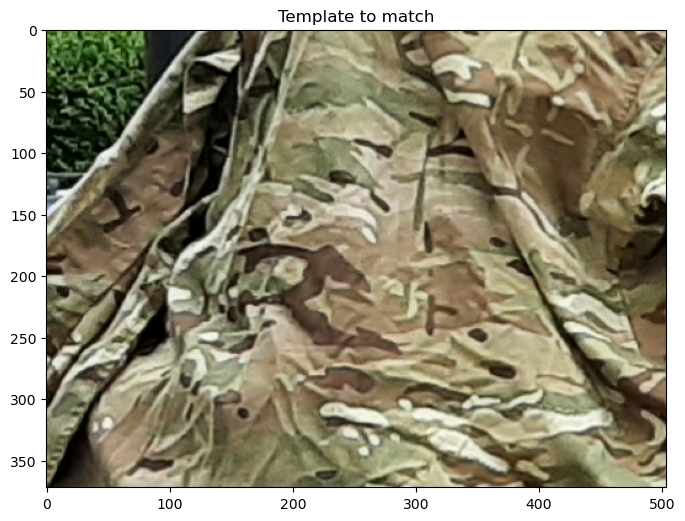

In [16]:
# Template to match
plt.figure(figsize=(8, 8))
plt.title('Template to match')
plt.imshow(blocks[18])
plt.show()

#### try match R33 template

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


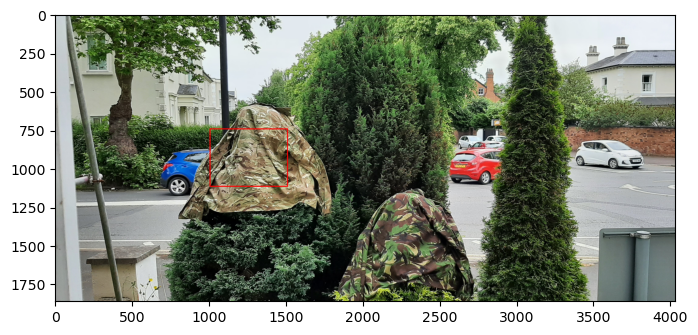

In [21]:

# read image
filename = 'camo1.jpg'
image = cv2.imread(filename)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying correctly
#image = image[:,:, 0] # taking only red channel

normalized_image = image / 255.0


# Convert the normalized image to float32
normalized_image = normalized_image.astype('float32')

# Calculate the size of each block
row_size = height // 5
col_size = width // 8

# Divide the image into 5 rows and 8 columns
blocks = []
for i in range(5):
    for j in range(8):
        block = normalized_image[i*row_size:(i+1)*row_size, j*col_size:(j+1)*col_size]
        blocks.append(block)

gray = cv2.cvtColor(normalized_image, cv2.COLOR_BGR2GRAY)
template = cv2.cvtColor(blocks[18], cv2.COLOR_BGR2GRAY)# taking R33 (block 15) block to match the disruptive pattern

# run template matching, get minimum val
res = cv2.matchTemplate(gray, template, cv2.TM_SQDIFF_NORMED)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

# create threshold from min val, find where sqdiff is less than thresh
min_thresh = (min_val + 1e-6) * 1.5
match_locations = np.where(res<=min_thresh)

# draw template match boxes
w, h = template.shape[::-1]
for (x, y) in zip(match_locations[1], match_locations[0]):
    cv2.rectangle(normalized_image, (x, y), (x+w, y+h), [255,0,0], 5)

# display result
plt.figure(figsize=(8, 8))
plt.imshow(normalized_image)
plt.show()

#### Try matching R55 template

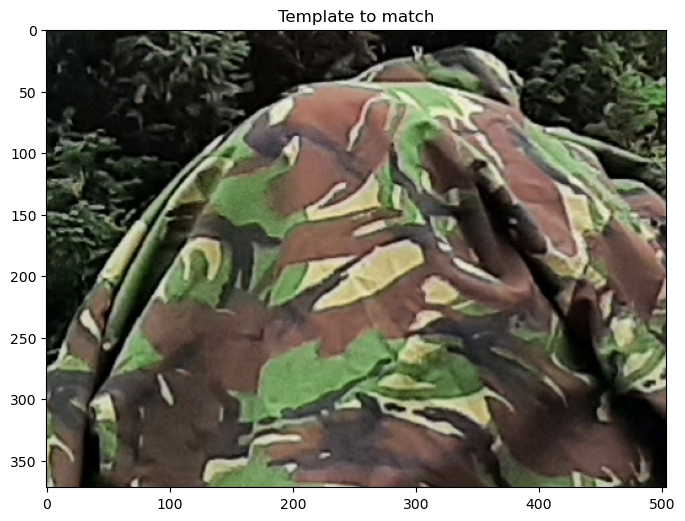

In [17]:
# Template to match
plt.figure(figsize=(8, 8))
plt.title('Template to match')
plt.imshow(blocks[28])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


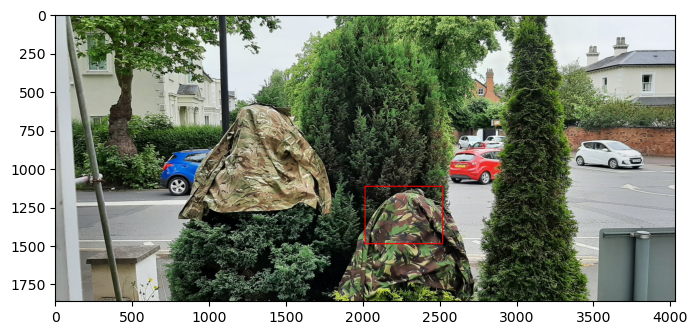

In [22]:
# read image
filename = 'camo1.jpg'
image = cv2.imread(filename)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying correctly
#image = image[:,:, 0] # taking only red channel

normalized_image = image / 255.0


# Convert the normalized image to float32
normalized_image = normalized_image.astype('float32')

# Calculate the size of each block
row_size = height // 5
col_size = width // 8

# Divide the image into 5 rows and 8 columns
blocks = []
for i in range(5):
    for j in range(8):
        block = normalized_image[i*row_size:(i+1)*row_size, j*col_size:(j+1)*col_size]
        blocks.append(block)

gray = cv2.cvtColor(normalized_image, cv2.COLOR_BGR2GRAY)
template = cv2.cvtColor(blocks[28], cv2.COLOR_BGR2GRAY)# taking R55 (block 28) block to match the disruptive pattern

# run template matching, get minimum val
res = cv2.matchTemplate(gray, template, cv2.TM_SQDIFF_NORMED)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

# create threshold from min val, find where sqdiff is less than thresh
min_thresh = (min_val + 1e-6) * 1.5
match_locations = np.where(res<=min_thresh)

# draw template match boxes
w, h = template.shape[::-1]
for (x, y) in zip(match_locations[1], match_locations[0]):
    cv2.rectangle(normalized_image, (x, y), (x+w, y+h), [255,0,0], 5)

# display result
plt.figure(figsize=(8, 8))
plt.imshow(normalized_image)
plt.show()

#### Time to test that take pattern from another image and match it in random unknown image
#### Result: It failed, I think because these two images (template to match, unknown input image) are of different sizes/dimensions. This might work if we take both images and template in the same scale

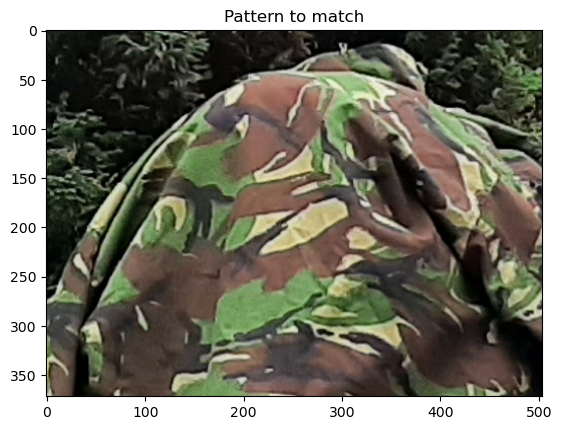

In [49]:

filename = 'camo1.jpg'
image = cv2.imread(filename)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying correctly
#image = image[:,:, 0] # taking only red channel

normalized_image = image / 255.0


# Convert the normalized image to float32
normalized_image = normalized_image.astype('float32')

# Calculate the size of each block
row_size = height // 5
col_size = width // 8

# Divide the image into 5 rows and 8 columns
blocks = []
for i in range(5):
    for j in range(8):
        block = normalized_image[i*row_size:(i+1)*row_size, j*col_size:(j+1)*col_size]
        blocks.append(block)

plt.title('Pattern to match')
plt.imshow(blocks[28])



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


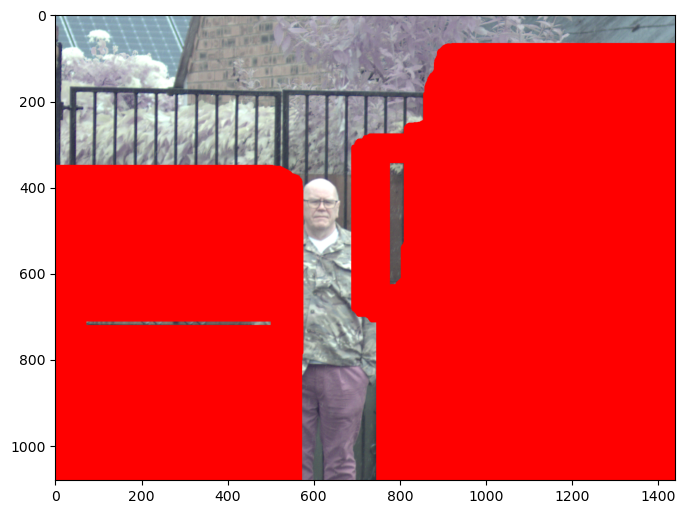

In [45]:
filename = 'camo2.bmp'
image = cv2.imread(filename)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying correctly
#image = image[:,:, 0] # taking only red channel

normalized_image = image / 255.0

# Convert the normalized image to float32
normalized_image = normalized_image.astype('float32')

gray = cv2.cvtColor(normalized_image, cv2.COLOR_BGR2GRAY)
template = cv2.cvtColor(blocks[28], cv2.COLOR_BGR2GRAY)# taking R55 (block 28) block to match the disruptive pattern

# run template matching, get minimum val
res = cv2.matchTemplate(gray, template, cv2.TM_SQDIFF_NORMED)

min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

# create threshold from min val, find where sqdiff is less than thresh
min_thresh = (min_val + 1e-6) * 1.2
match_locations = np.where(res<=min_thresh)

# draw template match boxes
w, h = template.shape[::-1]
for (x, y) in zip(match_locations[1], match_locations[0]):
    cv2.rectangle(normalized_image, (x, y), (x+w, y+h), [255,0,0], 5)

#display result
plt.figure(figsize=(8, 8))
plt.imshow(normalized_image)
plt.show()

#### Method 5: Multi-template matching with OpenCV
Reference: https://www.geeksforgeeks.org/multi-template-matching-with-opencv/

In [52]:
#lets save the templates as images first
plt.imsave('r55.jpg',blocks[28])
plt.imsave('r33.jpg',blocks[18])

In [54]:
! pip install imutils

  Preparing metadata (setup.py) ... done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25836 sha256=63f430480af0ff0eadd02ac5be7b7b0c963199e75b16a8ca019e33560493b4b9
  Stored in directory: /Users/tripti/Library/Caches/pip/wheels/85/cf/3a/e265e975a1e7c7e54eb3692d6aa4e2e7d6a3945d29da46f2d7
Successfully built imutils


#### Testing with r55

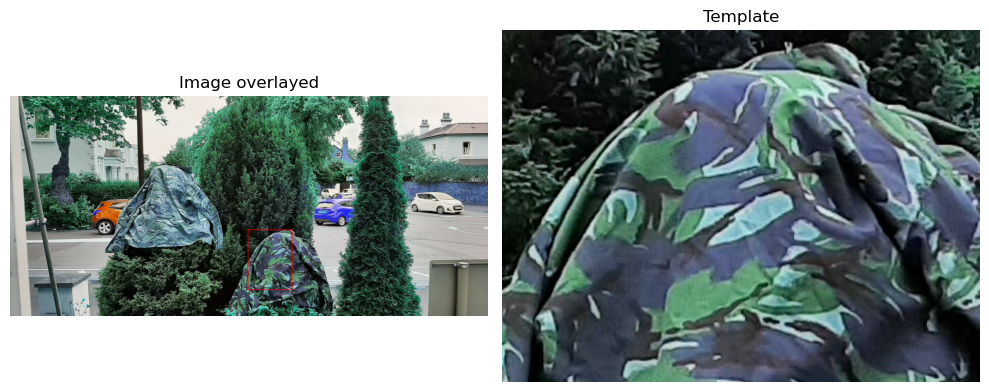

In [9]:
import cv2 
import numpy as np 
from imutils.object_detection import non_max_suppression 
import matplotlib.pyplot as plt

# Reading the image and the template 
img = cv2.imread('camo1.jpg') 
temp = cv2.imread('r55.jpg') 

# save the image dimensions 
W, H = temp.shape[:2] 

# Define a minimum threshold 
thresh = 0.4

# Converting them to grayscale 
img_gray = cv2.cvtColor(img, 
						cv2.COLOR_BGR2GRAY) 
temp_gray = cv2.cvtColor(temp, 
						cv2.COLOR_BGR2GRAY) 

# Passing the image to matchTemplate method 
match = cv2.matchTemplate( 
	image=img_gray, templ=temp_gray, 
method=cv2.TM_CCOEFF_NORMED) 

# Select rectangles with 
# confidence greater than threshold 
(y_points, x_points) = np.where(match >= thresh) 

# initialize our list of rectangles 
boxes = list() 

# loop over the starting (x, y)-coordinates again 
for (x, y) in zip(x_points, y_points): 
	
	# update our list of rectangles 
	boxes.append((x, y, x + W, y + H)) 

# apply non-maxima suppression to the rectangles 
# this will create a single bounding box 
boxes = non_max_suppression(np.array(boxes)) 

# loop over the final bounding boxes 
for (x1, y1, x2, y2) in boxes: 
	
	# draw the bounding box on the image 
	cv2.rectangle(img, (x1, y1), (x2, y2), 
				(255, 0, 0), 3) 

# # display result
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

ax1.imshow(img)
ax1.set_title('Image overlayed')
ax1.axis('off')

ax2.imshow(temp)
ax2.set_title('Template')
ax2.axis('off')

plt.tight_layout()
plt.show()


#### Testing with r33

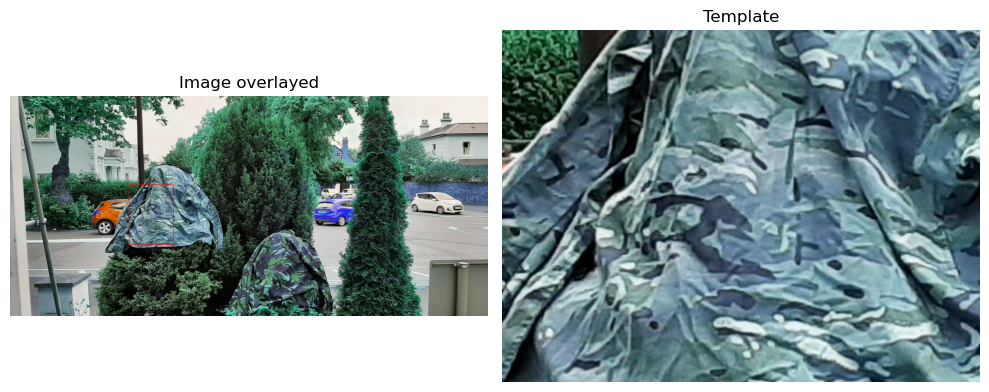

In [10]:
import cv2 
import numpy as np 
from imutils.object_detection import non_max_suppression 
import matplotlib.pyplot as plt

# Reading the image and the template 
img = cv2.imread('camo1.jpg') 
temp = cv2.imread('r33.jpg') 

# save the image dimensions 
W, H = temp.shape[:2] 

# Define a minimum threshold 
thresh = 0.4

# Converting them to grayscale 
img_gray = cv2.cvtColor(img, 
						cv2.COLOR_BGR2GRAY) 
temp_gray = cv2.cvtColor(temp, 
						cv2.COLOR_BGR2GRAY) 

# Passing the image to matchTemplate method 
match = cv2.matchTemplate( 
	image=img_gray, templ=temp_gray, 
method=cv2.TM_CCOEFF_NORMED) 

# Select rectangles with 
# confidence greater than threshold 
(y_points, x_points) = np.where(match >= thresh) 

# initialize our list of rectangles 
boxes = list() 

# loop over the starting (x, y)-coordinates again 
for (x, y) in zip(x_points, y_points): 
	
	# update our list of rectangles 
	boxes.append((x, y, x + W, y + H)) 

# apply non-maxima suppression to the rectangles 
# this will create a single bounding box 
boxes = non_max_suppression(np.array(boxes)) 

# loop over the final bounding boxes 
for (x1, y1, x2, y2) in boxes: 
	
	# draw the bounding box on the image 
	cv2.rectangle(img, (x1, y1), (x2, y2), 
				(255, 0, 0), 3) 

# # display result
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

ax1.imshow(img)
ax1.set_title('Image overlayed')
ax1.axis('off')

ax2.imshow(temp)
ax2.set_title('Template')
ax2.axis('off')

plt.tight_layout()
plt.show()

#### Final Test with unknown image

### Result: Changing the threshold value gives the output so we need to work around it. 

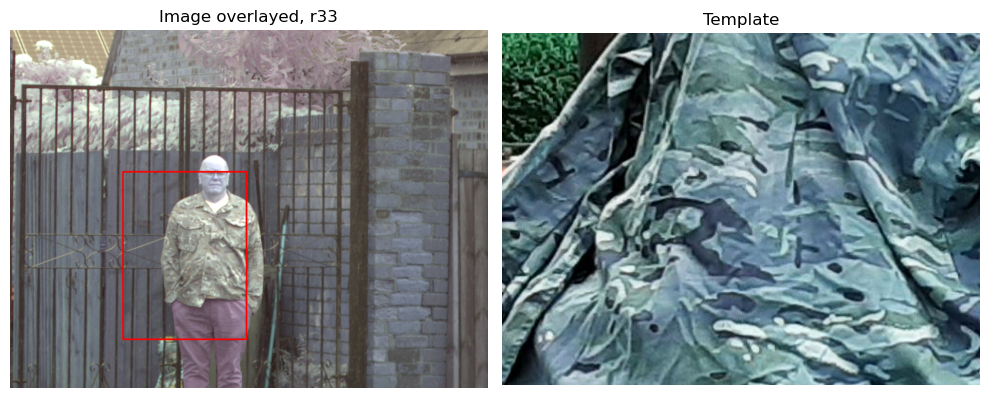

In [20]:
import cv2 
import numpy as np 
from imutils.object_detection import non_max_suppression 
import matplotlib.pyplot as plt

# Reading the image and the template 
img = cv2.imread('camo2.jpg') 
temp = cv2.imread('r33.jpg') 

# save the image dimensions 
W, H = temp.shape[:2] 

# Define a minimum threshold 
thresh = 0.2

# Converting them to grayscale 
img_gray = cv2.cvtColor(img, 
						cv2.COLOR_BGR2GRAY) 
temp_gray = cv2.cvtColor(temp, 
						cv2.COLOR_BGR2GRAY) 

# Passing the image to matchTemplate method 
match = cv2.matchTemplate( 
	image=img_gray, templ=temp_gray, 
method=cv2.TM_CCOEFF_NORMED) 

# Select rectangles with 
# confidence greater than threshold 
(y_points, x_points) = np.where(match >= thresh) 

# initialize our list of rectangles 
boxes = list() 

# loop over the starting (x, y)-coordinates again 
for (x, y) in zip(x_points, y_points): 
	
	# update our list of rectangles 
	boxes.append((x, y, x + W, y + H)) 

# apply non-maxima suppression to the rectangles 
# this will create a single bounding box 
boxes = non_max_suppression(np.array(boxes)) 

# loop over the final bounding boxes 
for (x1, y1, x2, y2) in boxes: 
	
	# draw the bounding box on the image 
	cv2.rectangle(img, (x1, y1), (x2, y2), 
				(255, 0, 0), 3) 

# # display result
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

ax1.imshow(img)
ax1.set_title('Image overlayed, r33')
ax1.axis('off')

ax2.imshow(temp)
ax2.set_title('Template')
ax2.axis('off')

plt.tight_layout()
plt.show()

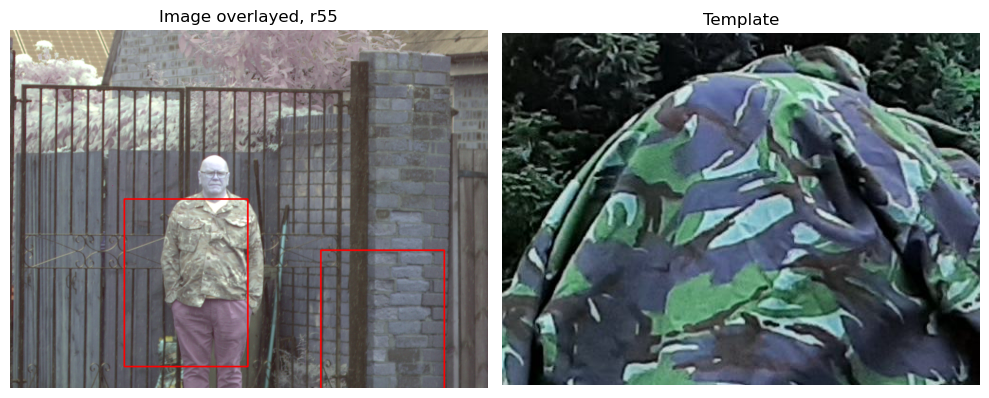

In [25]:
import cv2 
import numpy as np 
from imutils.object_detection import non_max_suppression 
import matplotlib.pyplot as plt

# Reading the image and the template 
img = cv2.imread('camo2.jpg') 
temp = cv2.imread('r55.jpg') 

# save the image dimensions 
W, H = temp.shape[:2] 

# Define a minimum threshold 
thresh = 0.2

# Converting them to grayscale 
img_gray = cv2.cvtColor(img, 
						cv2.COLOR_BGR2GRAY) 
temp_gray = cv2.cvtColor(temp, 
						cv2.COLOR_BGR2GRAY) 

# Passing the image to matchTemplate method 
match = cv2.matchTemplate( 
	image=img_gray, templ=temp_gray, 
method=cv2.TM_CCOEFF_NORMED) 

# Select rectangles with 
# confidence greater than threshold 
(y_points, x_points) = np.where(match >= thresh) 

# initialize our list of rectangles 
boxes = list() 

# loop over the starting (x, y)-coordinates again 
for (x, y) in zip(x_points, y_points): 
	
	# update our list of rectangles 
	boxes.append((x, y, x + W, y + H)) 

# apply non-maxima suppression to the rectangles 
# this will create a single bounding box 
boxes = non_max_suppression(np.array(boxes)) 

# loop over the final bounding boxes 
for (x1, y1, x2, y2) in boxes: 
	
	# draw the bounding box on the image 
	cv2.rectangle(img, (x1, y1), (x2, y2), 
				(255, 0, 0), 3) 

# # display result
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

ax1.imshow(img)
ax1.set_title('Image overlayed, r55')
ax1.axis('off')

ax2.imshow(temp)
ax2.set_title('Template')
ax2.axis('off')

plt.tight_layout()
plt.show()

#### Method 6: 
Reference: https://docs.opencv.org/3.4/d4/dc6/tutorial_py_template_matching.html

Result: Play around threshold for multiple object matching

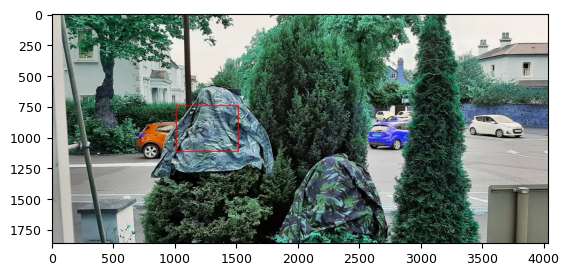

In [66]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img_rgb = cv.imread('camo1.jpg')
assert img_rgb is not None, "file could not be read, check with os.path.exists()"
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
template = cv.imread('r33.jpg', cv.IMREAD_GRAYSCALE)
assert template is not None, "file could not be read, check with os.path.exists()"
w, h = template.shape[::-1]
res = cv.matchTemplate(img_gray,template,cv.TM_CCOEFF_NORMED)
threshold = 0.8
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
 cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (255,0,0), 2)
plt.imshow(img_rgb)

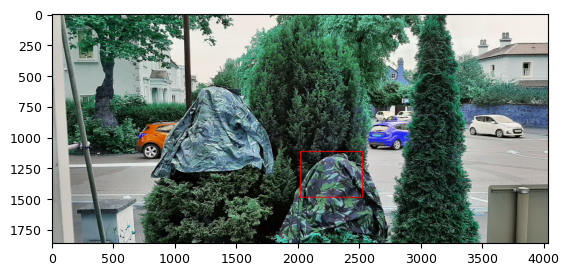

In [67]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img_rgb = cv.imread('camo1.jpg')
assert img_rgb is not None, "file could not be read, check with os.path.exists()"
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
template = cv.imread('r55.jpg', cv.IMREAD_GRAYSCALE)
assert template is not None, "file could not be read, check with os.path.exists()"
w, h = template.shape[::-1]
res = cv.matchTemplate(img_gray,template,cv.TM_CCOEFF_NORMED)
threshold = 0.8
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
 cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (255,0,0), 2)
plt.imshow(img_rgb)

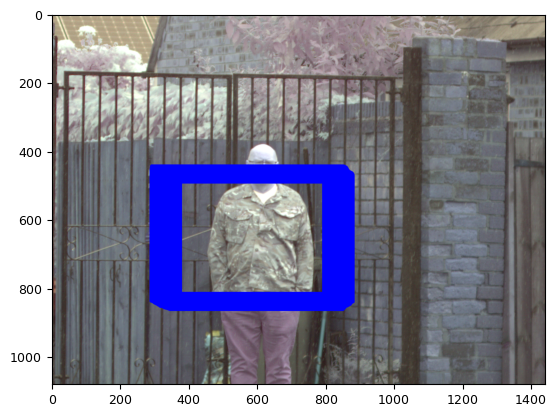

In [65]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img_rgb = cv.imread('camo2.jpg')
assert img_rgb is not None, "file could not be read, check with os.path.exists()"
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
template = cv.imread('r55.jpg', cv.IMREAD_GRAYSCALE)
assert template is not None, "file could not be read, check with os.path.exists()"
w, h = template.shape[::-1]
res = cv.matchTemplate(img_gray,template,cv.TM_CCOEFF_NORMED)
threshold = 0.25
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
 cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)
plt.imshow(img_rgb)